# Midterm Exam (part 3) - Computational Physics I

### Deadline: Friday 26 April 2024 (by 17h00)
### Credits: 10 points

## Name: Males Araujo Yorlan

## 8. 2D data analysis: subsonic versus supersonic turbulence (10 points)

We want to study the properties of subsonic and supersonic turbulent flows in 2D. Let us consider the following high-resolution simulations of turbulence-in-a-box models:

### Supersonic turbulence simulation:
https://yachaytecheduec-my.sharepoint.com/:f:/g/personal/wbanda_yachaytech_edu_ec/EhXQXyn8GudCnZ15af_fLdEBcbpt7hyYpjSnwsGHrG0kDA?e=IlgN7g

### Subsonic turbulence simulation:
https://yachaytecheduec-my.sharepoint.com/:f:/g/personal/wbanda_yachaytech_edu_ec/EhNeXlEHX3JAjUYV44981LgBo9tn_BEFtUQJx98iGClHxg?e=350N8b

As explained in class, these simulations introduce stochastic force fields to generate turbulent motions in an isothermal ($\gamma=1$) gas, which is initially at rest. Turbulence is continuously generated throughout the simulations.

The simulation folders contain 101 VTK files, jointly with:

- a **units.out** file that contains the CGS normalisation values.
- a **vtk.out** file whose second column contains the times in code units.

Each VTK file stores the following fields:

- density (rho)
- velocity_x (vx1)
- velocity_y (vx2)
- magnetic_field_x (Bx1)
- magnetic_field_y (Bx2)

Use python to carry out the following analysis:

### (a) Write a python function that reads a VTK data file and returns the density field, the components of the velocity field, and the components of the magnetic field, all normalised in CGS units.

In [1]:
# All the libraries
import numpy as np
import matplotlib.pyplot as plt
import pyvista as pv
import pandas as pd
import os
from skimage.transform import resize
import glob
from PIL import Image, ImageDraw
from IPython import display

In [2]:
# Function
def io_vtk(vtk, units, time):
    """
    Reads a VTK data file and returns the density field,
    the components of the velocity field, and the components
    of the magnetic field, all normalised in CGS units. 
    Inputs: vtk -> str storing the vtk file
            units -> str storing the units file
            time -> str storing the time file
    Outputs: mesh -> pyvista object with the vtk file data
             l_0 -> distance normalization factor
             c_iso -> sound speed in the medium
             time_cgs -> normalized 1D time array
             rho_cgs -> normalized 2D density array
             vx1_cgs -> normalized 2D x-velocity array
             vx2_cgs -> normalized 2D y-velocity array
             bx1_cgs -> normalized 2D x-magnetic-field array
             bx2_cgs -> normalized 2D y-magnetic-field array
    Author: MAY.
    Date: 23/04/2024
    """
    # The 2D data in code units,
    mesh = pv.read(vtk)
    
    # the cgs units file:
    df_units = pd.read_csv(units)

    # and the time.
    df_times = pd.read_csv(time, sep = "\s+", header = None)

    # Get data arrays in code units:
    rho = pv.get_array(mesh, "rho", preference = 'cell')
    vx1 = pv.get_array(mesh, "vx1", preference = 'cell')
    vx2 = pv.get_array(mesh, "vx2", preference = 'cell')
    bx1 = pv.get_array(mesh, "Bx1", preference = 'cell')
    bx2 = pv.get_array(mesh, "Bx2", preference = 'cell')

    time_array = np.array(df_times.iloc[:,1])

    # Now we get the units into python objects:
    rho_0 = np.array(df_units.loc[df_units["variable"] == "rho_0"]["normalisation"])
    v_0 = np.array(df_units.loc[df_units["variable"] == "v_0"]["normalisation"])
    l_0 = np.array(df_units.loc[df_units["variable"] == "L_0"]["normalisation"])
    c_iso = np.array(df_units.loc[df_units["variable"] == "c_iso"]["normalisation"])
    
    # And derive the units we'll use:
    # Time:
    t_0 = l_0/v_0

    # Pressure:
    p_0 = rho_0*v_0**2

    # Magnetic field:
    b_0 = v_0*np.sqrt(4*np.pi*rho_0)

    # Finally we normalise all the arrays:
    rho_cgs = rho*rho_0
    vx1_cgs = vx1*v_0
    vx2_cgs = vx2*v_0
    bx1_cgs = bx1*b_0
    bx2_cgs = bx2*b_0
    time_cgs = time_array*t_0

    return mesh, l_0, c_iso, time_cgs, rho_cgs, vx1_cgs, vx2_cgs, bx1_cgs, bx2_cgs

<>:29: SyntaxWarning: invalid escape sequence '\s'
<>:29: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_41102/2459884962.py:29: SyntaxWarning: invalid escape sequence '\s'
  df_times = pd.read_csv(time, sep = "\s+", header = None)


### (b) Call the above function for VTK file # 50 of each simulation, and make the following maps using the correct mesh coordinates and dimensions:

- A 2-panel figure showing the supersonic (left) and subsonic (right) density, $\rho$.
- A 2-panel figure showing the supersonic (left) and subsonic (right) velocity magnitude, $v=\sqrt{v_x^2+v_y^2}$.
- A 2-panel figure showing the supersonic (left) and subsonic (right) magnetic vector field, $\vec{B}= \vec{B}_x + \vec{B}_y$.

**Notes:** Choose different perceptually-uniform colour schemes for each of the above quantities. Since these are high-resolution models, one way to improve the visualisation of 2D vector fields is to interpolate them into a coarser (not in very small pieces) grid.

In [3]:
# We first assign the variables:
# Subsonic:
vtk_sub = "/home/whyyorlantaken/Documents/Yachay-Tech/Physics/Comp-Phys-I/data/TURB_DRIVE_SUB_hr/data.0050.vtk"
time_sub ="/home/whyyorlantaken/Documents/Yachay-Tech/Physics/Comp-Phys-I/data/TURB_DRIVE_SUB_hr/vtk.out"

# Supersonic:
vtk_sup = "/home/whyyorlantaken/Documents/Yachay-Tech/Physics/Comp-Phys-I/data/TURB_DRIVE_SUP_hr/data.0050.vtk"
time_sup ="/home/whyyorlantaken/Documents/Yachay-Tech/Physics/Comp-Phys-I/data/TURB_DRIVE_SUP_hr/vtk.out"

# And the units: 
units = "/home/whyyorlantaken/Documents/Yachay-Tech/Physics/Comp-Phys-I/data/TURB_DRIVE_SUB_hr/units.out"

# And then we call the function for each:
mesh, l_0, c_iso, t_sub, rho_sub, v1_sub, v2_sub, b1_sub, b2_sub = io_vtk(vtk_sub, units, time_sub)
_, _, _, t_sup, rho_sup, v1_sup, v2_sup, b1_sup, b2_sup = io_vtk(vtk_sup, units, time_sup)

In [4]:
# Reshape them in 2D:
rho_sub_2d = rho_sub.reshape(mesh.dimensions[0] - 1, mesh.dimensions[1] - 1)
v1_sub_2d = v1_sub.reshape(mesh.dimensions[0] - 1, mesh.dimensions[1] - 1)
v2_sub_2d = v2_sub.reshape(mesh.dimensions[0] - 1, mesh.dimensions[1] - 1)
b1_sub_2d = b1_sub.reshape(mesh.dimensions[0] - 1, mesh.dimensions[1] - 1)
b2_sub_2d = b2_sub.reshape(mesh.dimensions[0] - 1, mesh.dimensions[1] - 1)

rho_sup_2d = rho_sup.reshape(mesh.dimensions[0] - 1, mesh.dimensions[1] - 1)
v1_sup_2d = v1_sup.reshape(mesh.dimensions[0] - 1, mesh.dimensions[1] - 1)
v2_sup_2d = v2_sup.reshape(mesh.dimensions[0] - 1, mesh.dimensions[1] - 1)
b1_sup_2d = b1_sup.reshape(mesh.dimensions[0] - 1, mesh.dimensions[1] - 1)
b2_sup_2d = b2_sup.reshape(mesh.dimensions[0] - 1, mesh.dimensions[1] - 1)

# Resizing:
# The density and velocity components were resized from (200, 200) to (400, 400),
# while the magnetic field components from (200, 200) to (50, 50). 
# These changes were made to improve the visualization. 

rho_sub_2d_res = resize(rho_sub_2d, (400,400), preserve_range = True)
v1_sub_2d_res = resize(v1_sub_2d, (400,400), preserve_range = True)
v2_sub_2d_res = resize(v2_sub_2d, (400,400), preserve_range = True)
b1_sub_2d_res = resize(b1_sub_2d, (50,50), preserve_range = True)
b2_sub_2d_res = resize(b2_sub_2d, (50,50), preserve_range = True)

rho_sup_2d_res = resize(rho_sup_2d, (400,400), preserve_range = True)
v1_sup_2d_res = resize(v1_sup_2d, (400,400), preserve_range = True)
v2_sup_2d_res = resize(v2_sup_2d, (400,400), preserve_range = True)
b1_sup_2d_res = resize(b1_sup_2d, (50,50), preserve_range = True)
b2_sup_2d_res = resize(b2_sup_2d, (50,50), preserve_range = True)

In [5]:
# Grids.
# The grid in physical units for the density and velocities:
x = np.linspace(mesh.bounds[0], mesh.bounds[1], (mesh.dimensions[0] - 1)*2)*l_0
y = np.linspace(mesh.bounds[2], mesh.bounds[3], (mesh.dimensions[0] - 1)*2)*l_0

x_2d, y_2d = np.meshgrid(x, y)
# print(x.shape)

# And the grid to use for the magnetic fields: 
x_b = np.linspace(mesh.bounds[0], mesh.bounds[1], (mesh.dimensions[0] - 1)//4)*l_0
y_b = np.linspace(mesh.bounds[2], mesh.bounds[3], (mesh.dimensions[0] - 1)//4)*l_0

xb_2d, yb_2d = np.meshgrid(x_b, y_b)
# print(x_b.shape)

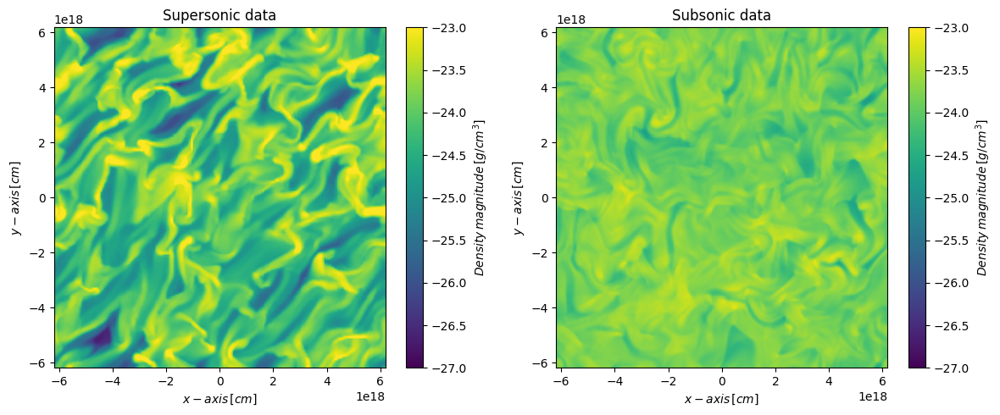

In [6]:
# Plotting the density:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

plt.sca(axes[0])
z_dens1 = plt.pcolor(x_2d, y_2d, np.log10(rho_sup_2d_res), cmap = "viridis", vmin=-27, vmax=-23)
plt.colorbar(z_dens1, label = r"$Density\, magnitude\, [g/cm^3]$")
plt.title('Supersonic data')
plt.xlabel(r"$x-axis\, [cm]$")
plt.ylabel(r"$y-axis\, [cm]$")

plt.sca(axes[1])
z_dens2 = plt.pcolor(x_2d, y_2d, np.log10(rho_sub_2d_res), cmap = "viridis", vmin=-27, vmax=-23)  
plt.colorbar(z_dens2, label = r"$Density\, magnitude\, [g/cm^3]$")
plt.title('Subsonic data')
plt.xlabel(r"$x-axis\, [cm]$")
plt.ylabel(r"$y-axis\, [cm]$")

plt.tight_layout() 
plt.show()

In [7]:
# Getting the velocity magnitudes:
v_sub_2d = np.sqrt(v1_sub_2d_res**2 + v2_sub_2d_res**2)
v_sup_2d = np.sqrt(v1_sup_2d_res**2 + v2_sup_2d_res**2)

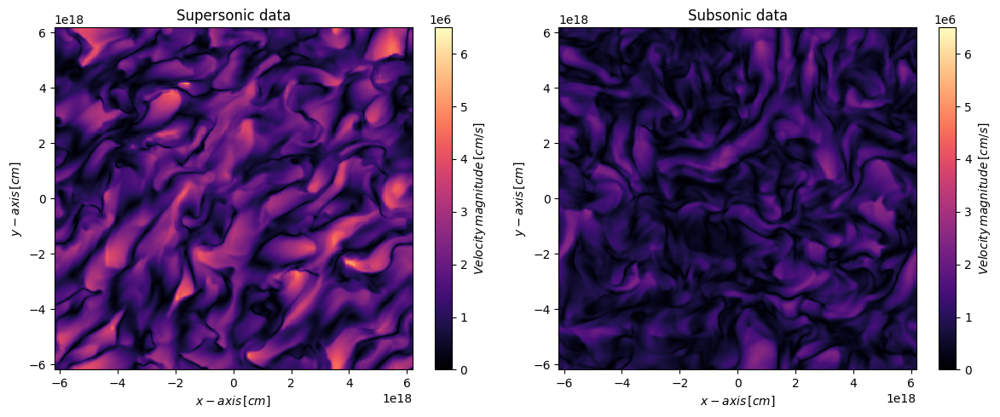

In [8]:
# Plotting the velocities:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

plt.sca(axes[0])
z_vel1 = plt.pcolor(x_2d, y_2d, v_sup_2d, cmap = "magma", vmin=0, vmax=6.5e6)
plt.colorbar(z_vel1, label = r"$Velocity\, magnitude\, [cm/s]$")
plt.title('Supersonic data')
plt.xlabel(r"$x-axis\, [cm]$")
plt.ylabel(r"$y-axis\, [cm]$")

plt.sca(axes[1])
z_vel2 = plt.pcolor(x_2d, y_2d, v_sub_2d, cmap = "magma", vmin=0, vmax=6.5e6)  
plt.colorbar(z_vel2, label = r"$Velocity\, magnitude\, [cm/s]$")
plt.title('Subsonic data')
plt.xlabel(r"$x-axis\, [cm]$")
plt.ylabel(r"$y-axis\, [cm]$")

plt.tight_layout() 
plt.show()

In [9]:
# Now the magnitude of the magnetic fields:
mag_b_sub = np.sqrt(b1_sub_2d_res**2 + b2_sub_2d_res**2)
mag_b_sup = np.sqrt(b1_sup_2d_res**2 + b2_sup_2d_res**2)

# print(b1_sub_2d_res.shape, mag_b_sub.shape)

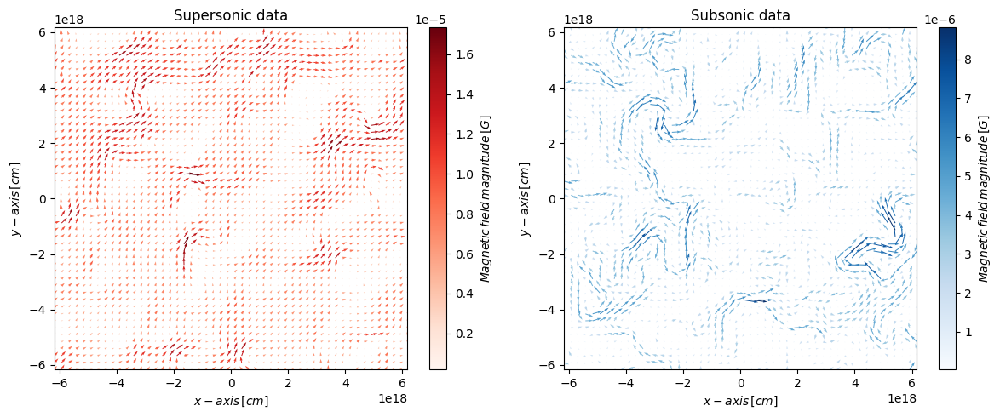

In [10]:
# Plotting:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

plt.sca(axes[0])
z_mag = plt.quiver(xb_2d, yb_2d, b1_sup_2d_res, b2_sup_2d_res, mag_b_sup, cmap = "Reds")
plt.colorbar(z_mag, label = r"$Magnetic\, field\, magnitude\, [G]$")
plt.title('Supersonic data')
plt.xlabel(r"$x-axis\, [cm]$")
plt.ylabel(r"$y-axis\, [cm]$")
plt.xlim(x[0],x[-1])
plt.ylim(y[0],y[-1])

plt.sca(axes[1])
z_mag = plt.quiver(xb_2d, yb_2d, b1_sub_2d_res, b2_sub_2d_res, mag_b_sub, cmap = "Blues")
plt.colorbar(z_mag, label = r"$Magnetic\, field\, magnitude\, [G]$")
plt.title('Subsonic data')
plt.xlabel(r"$x-axis\, [cm]$")
plt.ylabel(r"$y-axis\, [cm]$")

plt.xlim(x[0],x[-1])
plt.ylim(y[0],y[-1])

plt.tight_layout() 
plt.show()

### (c) Compute 1D histograms of the density and the velocity magnitude, and make the following figures:

- A 2-panel figure showing the supersonic (left) and subsonic (right) 1D histograms of the density for VTK file # 50.
- A 2-panel figure showing the supersonic (left) and subsonic (right) 1D histograms of the velocity magnitude for VTK file # 50.

In [11]:
# We need 1D arrays, so we compute the ones for the velocity magnitudes.
v_sub = np.sqrt(v1_sub**2 + v2_sub**2)
v_sup = np.sqrt(v1_sup**2 + v2_sup**2)

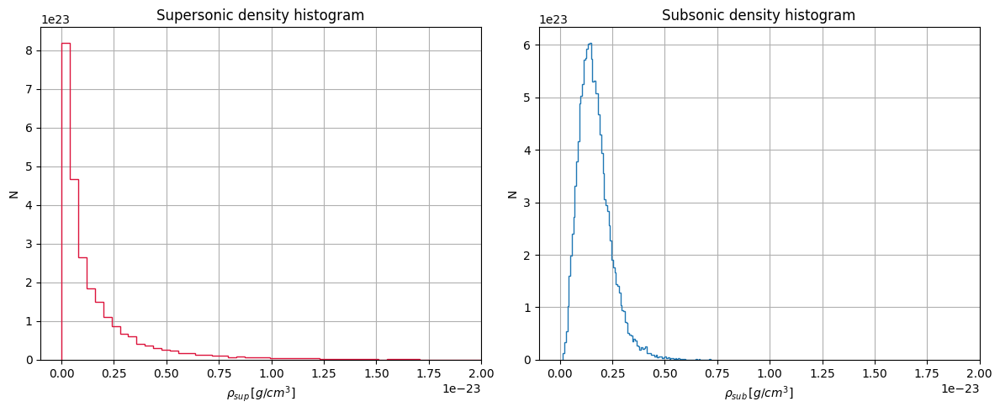

In [12]:
# Now we do the histograms for the densities first.
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

plt.sca(axes[0])
n, bins, patches = plt.hist(rho_sup, 100, histtype = "step", color = "crimson", density = True)
plt.title('Supersonic density histogram')
plt.xlim(-1e-24, 2e-23)
plt.xlabel(r"$\rho_{sup}\, [g/cm^3]$")
plt.ylabel(r"N")
plt.grid()

plt.sca(axes[1])
n, bins, patches = plt.hist(rho_sub, 100, histtype = "step", density = True)
plt.title('Subsonic density histogram')
plt.xlim(-1e-24, 2e-23)
plt.xlabel(r"$\rho_{sub}\, [g/cm^3]$")
plt.ylabel(r"N")
plt.grid()

plt.tight_layout() 
plt.show()

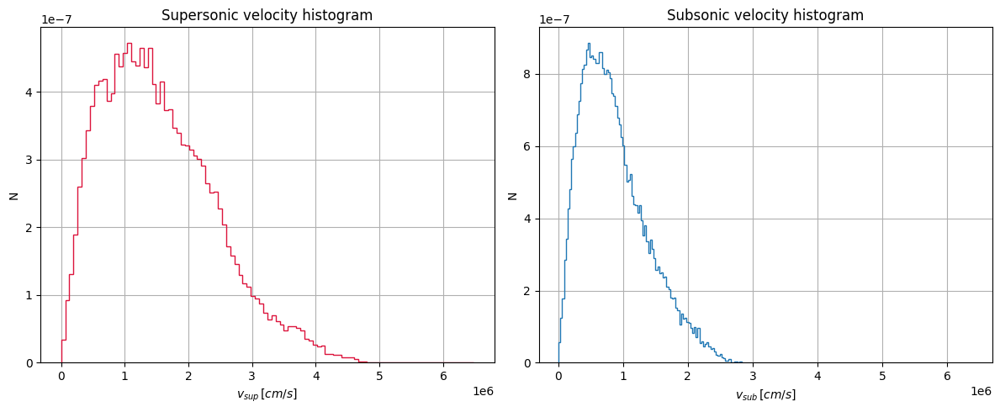

In [13]:
# The velocity magnitudes.
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

plt.sca(axes[0])
n, bins, patches = plt.hist(v_sup, 100, histtype = "step",color = "crimson", density = True)
plt.title('Supersonic velocity histogram')
plt.xlabel(r"$v_{sup}\,[cm/s]$")
plt.ylabel(r"N")
plt.grid()

plt.sca(axes[1])
n, bins, patches = plt.hist(v_sub, 100, histtype = "step", density = True)
plt.title('Subsonic velocity histogram')
plt.xlabel(r"$v_{sub}\,[cm/s]$")
plt.ylabel(r"N")
plt.xlim(-3e5, 6.7e6)
plt.grid()

plt.tight_layout() 
plt.show()

### (d) What distributions do the density and velocity fields have? Do you see differences between the supersonic and subsonic distributions? Why?

They all, densities and velocities, seem to describe log-normal distributions with different parameters. 

The density histograms differ in skewness: the supersonic density histogram has a higher level of it than the subsonic one, which is characteristic of supersonic density histograms. As for the velocity histograms, they have very similar shapes, but the supersonic data covers a wider range of velocities since it is supersonic.

### (e) Create a python function that loops over all VTK files and saves maps (in PNG format) of the velocity field magnitude for all times. Add time stamps in physical units to the maps.

In [14]:
# Function
def maps_png(vtk_name, units, t_name, folder):
    """
    Loops over all VTK files and saves png maps 
    of the velocity field magnitude for all times. 
    Also, adds time stamps in physical units to the maps. 
    Inputs: vtk_name -> str which will get all the VTK files
            units -> str with the units file
            t_name -> str with the times file
            folder -> name of the folder 
    Outputs: The function itself.
    Author: MAY.
    Date: 24/04/2024
    """
    # Creating the folder:
    if os.path.isdir(folder):
        print("The folder already exists.") # This does nothing.  
    else:
        os.mkdir(folder)
        
    # The loop:
    for i in range(0, len(t_name) + 2):
        
        # Here we get all the files:
        all_vtk = vtk_name.format(i)
        
        # Use the function we defined earlier:
        mesh, l_0, _, t_cgs, _, v1, v2, _, _ = io_vtk(all_vtk, units, t_name)

        # Reshape v1 and v2:
        v1_2d = v1.reshape(mesh.dimensions[0] - 1, mesh.dimensions[1] - 1)
        v2_2d = v2.reshape(mesh.dimensions[0] - 1, mesh.dimensions[1] - 1)
        
        # and compute the magnitude of the velocity field.
        v_mag = np.sqrt(v1_2d**2 + v2_2d**2)

        # The plots:
        z_mag = plt.imshow(v_mag, cmap = "magma", vmin = 0, vmax = 6e6)
        plt.colorbar(z_mag, label = r"$Magnitude\, [cm/s]$")
        plt.title(f'$Velocity\, field\, magnitude$ \n $at\, t\,=\,{t_cgs[i]:.2e}\, s$')
        plt.xlabel(r"$x-axis\, [cm]$")
        plt.ylabel(r"$y-axis\, [cm]$")
        
        # And save them in the specified path:
        plt.savefig(os.path.join(folder, "velocity_field_magnitude{:03d}.png".format(i)))
        plt.close()

<>:40: SyntaxWarning: invalid escape sequence '\,'
<>:40: SyntaxWarning: invalid escape sequence '\,'
<>:40: SyntaxWarning: invalid escape sequence '\,'
<>:40: SyntaxWarning: invalid escape sequence '\,'
/tmp/ipykernel_41102/3755624074.py:40: SyntaxWarning: invalid escape sequence '\,'
  plt.title(f'$Velocity\, field\, magnitude$ \n $at\, t\,=\,{t_cgs[i]:.2e}\, s$')
/tmp/ipykernel_41102/3755624074.py:40: SyntaxWarning: invalid escape sequence '\,'
  plt.title(f'$Velocity\, field\, magnitude$ \n $at\, t\,=\,{t_cgs[i]:.2e}\, s$')


In [16]:
# We do it with the subsonic files first:
folder_sub = "./vel_mag_sub"
vtks_sub = "/home/whyyorlantaken/Documents/Yachay-Tech/Physics/Comp-Phys-I/data/TURB_DRIVE_SUB_hr/data.0{:03d}.vtk"

maps_png(vtks_sub, units, time_sub, folder_sub)

The folder already exists.


In [18]:
# And the supersonic data:
folder_sup = "./vel_mag_sup"
vtks_sup = "/home/whyyorlantaken/Documents/Yachay-Tech/Physics/Comp-Phys-I/data/TURB_DRIVE_SUP_hr/data.0{:03d}.vtk"

maps_png(vtks_sup, units, time_sup, folder_sup)

The folder already exists.


Having checked all the generated maps in their respective folders, it seems that the function is working properly.

### (f) Create a python function that takes the velocity field components as arguments, loops over all the simulation VTK files, and computes the following quantities for each time:

- the average velocity, $[v]$,

- the rms velocity, $\sqrt{[v^2]}$,

- the (volume-weighted) average velocity dispersion, $\sigma_v = \sqrt{[ v^2 ] - [v ]^2}$.

- the rms Mach number, ${\cal M}_{\rm rms}$, for which you need $c_{\rm iso}$ given in **units.out**,

and returns:

- a CSV file with 5 columns, time on the first column, and the above quantities in the next ones.

I've given it some thought and don't really know how to do it with the velocity field components as arguments.

In [21]:
# Function
def io_data_loop(vtk_name, t_name, name_csv):
    """
    Loops over all the simulation VTK files,
    and computes five quantities. 
    Inputs: vtk_name -> str which will get all the VTK files
            t_name -> str with the times file
            name_csv -> name of the .csv file
    Ouput: df -> csv file with five columns: times, avg velocity,
                 rms velocity, avg velocity dispersion and RMS Mach
                 number. All normalized. 
    Author: MAY.
    Date: 24/04/2024
    """
    # Empty lists:
    v_list = []
    rms_list = []
    diff_list = []
    m_list = []
    
    # Looping:
    for i in range(0, len(t_name) + 8): # The 8 just worked. Do not know why!
        
        # Here we get all the files:
        all_vtk = vtk_name.format(i)
        
        # Use the function we defined earlier:
        mesh, _, c_iso, t_array, _, v1, v2, _, _ = io_vtk(all_vtk, units, t_name)

        # Reshape v1 and v2:
        v1_2d = v1.reshape(mesh.dimensions[0] - 1, mesh.dimensions[1] - 1)
        v2_2d = v2.reshape(mesh.dimensions[0] - 1, mesh.dimensions[1] - 1)

        # Start computing
        
        # 1. Average velocity
        # Getting the velocity magnitudes:
        vel_2d = np.sqrt(v1_2d**2 + v2_2d**2)
        # And its averages:
        v_list.append(np.mean(vel_2d))
        
        # 2. rms velocity
        # The v^2 and its average:
        vel_2d_square = v1_2d**2 + v2_2d**2
        rms_list.append(np.mean(vel_2d_square))
        # The rms velocity array will be obtained outside the loop.

        # 3. Average velocity dispersion:
        # It will be gotten outside the loop.

        # 4. rms Mach number:
        rms_2d = np.mean(vel_2d)/c_iso 
        m_list.append(rms_2d)
        
    # Getting the arrays:
    vel_array = np.array(v_list)
    rms_array = np.sqrt(np.array(rms_list))
    disp_array = np.sqrt(rms_array**2 - vel_array**2)
    mach_array = np.array(m_list).reshape(101,)

    # Data frame:
    df = pd.DataFrame({"Time [s]": t_array, "Avg vel [cm/s]": vel_array, "RMS vel [cm/s]": rms_array,
                       "Avg velocity dispersion [cm/s]": disp_array, "Mach number": mach_array},
                     index = None)

    # Save the data frame:
    df.to_csv(f"{name_csv}", sep=',', float_format='{:.4e}'.format, index = False)
    
    return df

### (g) Call your function from (f) for each simulation set (supersonic and subsonic) and use the CSV files to make the following plots:

- A 2-panel figure showing the supersonic (left) and subsonic (right) average velocity versus time.
- A 2-panel figure showing the supersonic (left) and subsonic (right) rms velocity versus time.
- A 2-panel figure showing the supersonic (left) and subsonic (right) velocity dispersion versus time.
- A 2-panel figure showing the supersonic (left) and subsonic (right) rms Mach number versus time.

In [22]:
# We get the .csv files for the two sets of data.

# Supersonic (using what's been defined before):
name_sup = "df_supersonic.csv"
df_sup = io_data_loop(vtks_sup, time_sup, name_sup)

# Subsonic:
name_sub = "df_subsonic.csv"
df_sub = io_data_loop(vtks_sub, time_sub, name_sub)

In [23]:
# We get all the arrays:

# Supersonic data:
tiempo_sup = df_sup["Time [s]"] 
avg_vel_sup = df_sup["Avg vel [cm/s]"]
rms_vel_sup = df_sup["RMS vel [cm/s]"]
disp_vel_sup = df_sup["Avg velocity dispersion [cm/s]"]
rms_mach_sup = df_sup["Mach number"]

# Subsonic data:
tiempo_sub = df_sub["Time [s]"] 
avg_vel_sub = df_sub["Avg vel [cm/s]"]
rms_vel_sub = df_sub["RMS vel [cm/s]"]
disp_vel_sub = df_sub["Avg velocity dispersion [cm/s]"]
rms_mach_sub = df_sub["Mach number"]

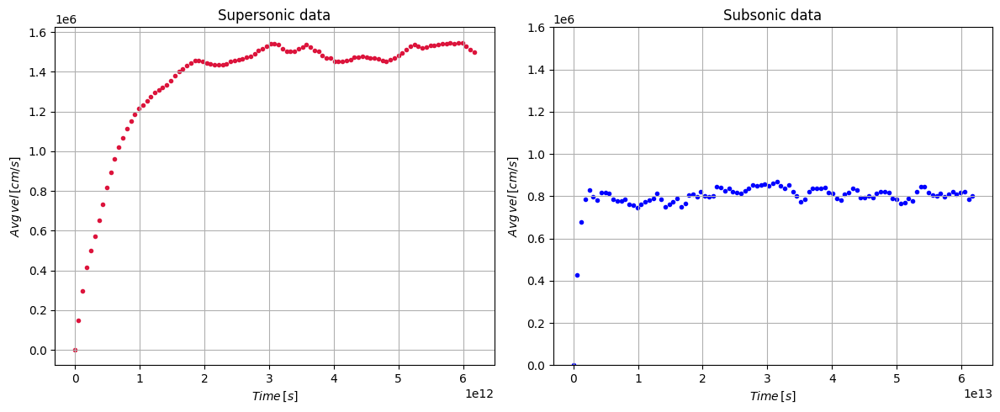

In [24]:
# Avg vel vs. time plot.
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

plt.sca(axes[0])
plt.scatter(tiempo_sup, avg_vel_sup, marker = ".", color = "crimson")
plt.title('Supersonic data')
plt.xlabel(r"$Time\,[s]$")
plt.ylabel(r"$Avg\, vel\,[cm/s]$")
plt.grid()

plt.sca(axes[1])
plt.scatter(tiempo_sub, avg_vel_sub, marker = ".", color = "blue")
plt.title('Subsonic data')
plt.xlabel(r"$Time\,[s]$")
plt.ylabel(r"$Avg\, vel\,[cm/s]$")
plt.ylim(0,1.6e6)
plt.grid()

plt.tight_layout() 
plt.show()

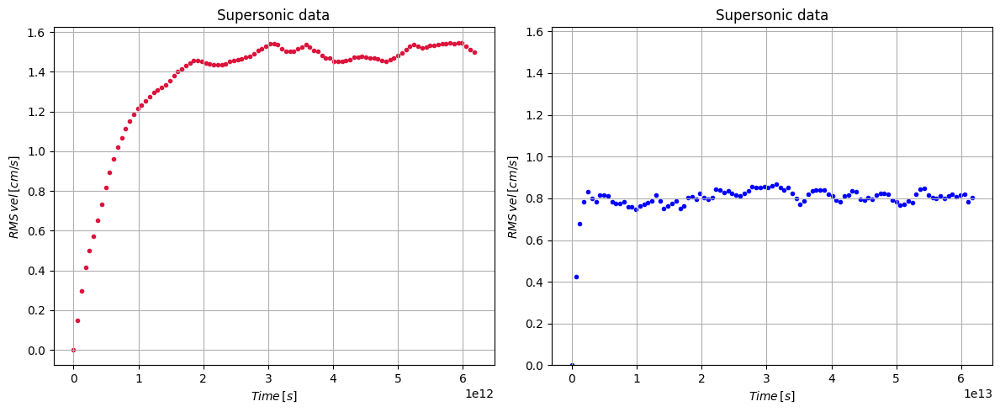

In [25]:
# RMS vel vs. time:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

plt.sca(axes[0])
plt.scatter(tiempo_sup, rms_mach_sup, marker = ".", color = "crimson")
plt.title('Supersonic data')
plt.xlabel(r"$Time\,[s]$")
plt.ylabel(r"$RMS\, vel\,[cm/s]$")
plt.grid()

plt.sca(axes[1])
plt.scatter(tiempo_sub, rms_mach_sub, marker = ".", color = "blue")
plt.title('Supersonic data')
plt.xlabel(r"$Time\,[s]$")
plt.ylabel(r"$RMS\, vel\,[cm/s]$")
plt.ylim(0, 1.62)
plt.grid()

plt.tight_layout() 
plt.show()

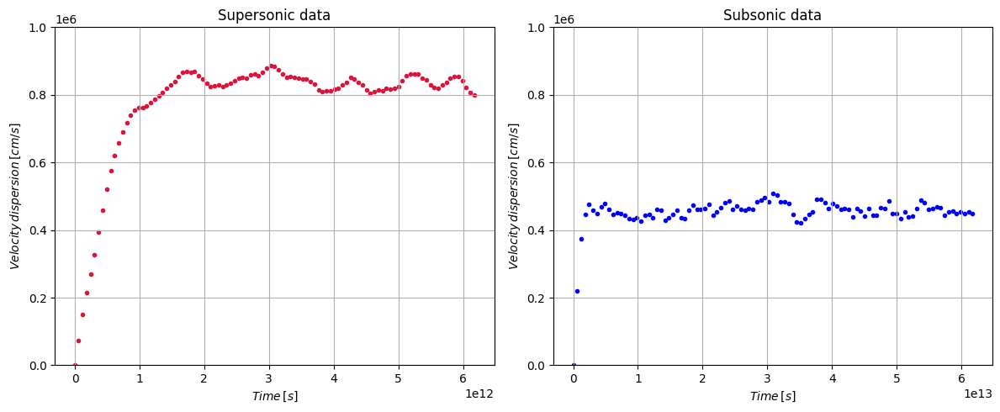

In [26]:
# Disp vel vs. time:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

plt.sca(axes[0])
plt.scatter(tiempo_sup, disp_vel_sup, marker = ".", color = "crimson")
plt.title('Supersonic data')
plt.xlabel(r"$Time\,[s]$")
plt.ylabel(r"$Velocity\, dispersion\,[cm/s]$")
plt.ylim(0, 1000000)
plt.grid()

plt.sca(axes[1])
plt.scatter(tiempo_sub, disp_vel_sub, marker = ".", color = "b")
plt.title('Subsonic data')
plt.xlabel(r"$Time\,[s]$")
plt.ylabel(r"$Velocity\, dispersion\,[cm/s]$")
plt.ylim(0, 1000000)
plt.grid()

plt.tight_layout() 
plt.show()

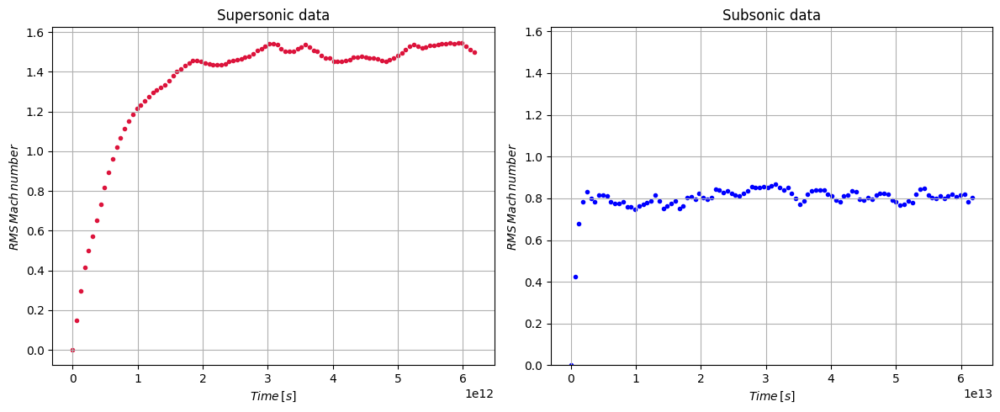

In [27]:
# RMS vel vs. time:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

plt.sca(axes[0])
plt.scatter(tiempo_sup, rms_mach_sup, marker = ".", color = "crimson")
plt.title('Supersonic data')
plt.xlabel(r"$Time\,[s]$")
plt.ylabel(r"$RMS\, Mach\, number$")
plt.grid()

plt.sca(axes[1])
plt.scatter(tiempo_sub, rms_mach_sub, marker = ".", color = "b")
plt.title('Subsonic data')
plt.xlabel(r"$Time\,[s]$")
plt.ylabel(r"$RMS\, Mach\, number$")
plt.ylim(0,1.62)
plt.grid()
#plt.xlim(0, 6e12) # The zoom.

plt.tight_layout() 
plt.show()

### (h) Briefly describe in your own words what happens to the gas and how turbulence emerges and evolves during these simulations. Does the flow reach steady state in both models? At what times?

Both simulations portray similar behaviours with one noticeable difference: whether or not the speed sound barrier is exceeded. Other than that, the shape the data points trace follow alike tendencies in different times. The temperature of the gas might be different: higher where the turbulence is supersonic. As for the turbulence, we can say that it, in both cases, emerges slowly until it reaches steady state, where it stays for an even longer time.

Steady state is reached in both models at what seems to be similar times. The time intervals differ in one order of magnitude, but it was possible to observe (with a zoom) that they both reached it at around $t=2.5\times10^6\,s$.

### (i) What are the time-averaged rms Mach numbers of each model (supersonic and subsonic) during steady state? Are they actually supersonic and subsonic turbulence models?

Before doing the calculations, by looking at the plot, they do describe those models in their steady states. Let's do the calculations to confirm it.

In [28]:
# We get the arrays with the steady state data only: 
# We chose it to be the second half of the data in both cases.
rms_mach_sup_st = rms_mach_sup[50:]
rms_mach_sub_st = rms_mach_sub[50:]

# And compute the averages:
print(f"The time-averaged RMS Mach numbers, supersonic and subsonic, respectively, are: {np.mean(rms_mach_sup_st)}, {np.mean(rms_mach_sub_st)}.")

The time-averaged RMS Mach numbers, supersonic and subsonic, respectively, are: 1.5009912784306805, 0.8131537140101479.


So they are indeed supersonic and subsonic turbulence models.

### (j) Create a python function that returns movies for each simulation (supersonic and subsonic) showing the time evolution of:

- maps of the velocity field magnitude (printed in e), jointly with

- the rms Mach numbers computed in (g).

In [29]:
# The function:
def movies(images_input, imgif_output, rms_array):
    """
    Creates movies for a simulation showing the
    time evolution of maps (PNGs) and attaches to
    them the corresponding value of an array.
    Inputs: images_input -> str containing ALL the maps (***)
            imgif_output -> str with the name of the resulting movie
            rms_array -> array with the value to attach
    No outputs. The function itself.
    Author: MAY.
    Date: 25/04/2024
    """
    # Get the images.
    # Define an empty list:
    images = []

    # The loop.
    # zip() is used to iterate over both the images and the rms array:
    for i, j in zip(sorted(glob.glob(images_input)), rms_array):

        # Getting the images:
        img = Image.open(i)
    
        # Here we add the RMS Mach numbers to the images:
        draw = ImageDraw.Draw(img)
        draw.text((460, 20), f"RMS Mach number: {j:.2f}", fill=(0, 0, 0))

        # And append all the new images to the empty list.
        images.append(img)

    # Finally saving them in a gift:
    
    images[0].save(fp = imgif_output, format = "GIF", append_images = images[1:],\
                   save_all = True, duration = 200, loop =0)

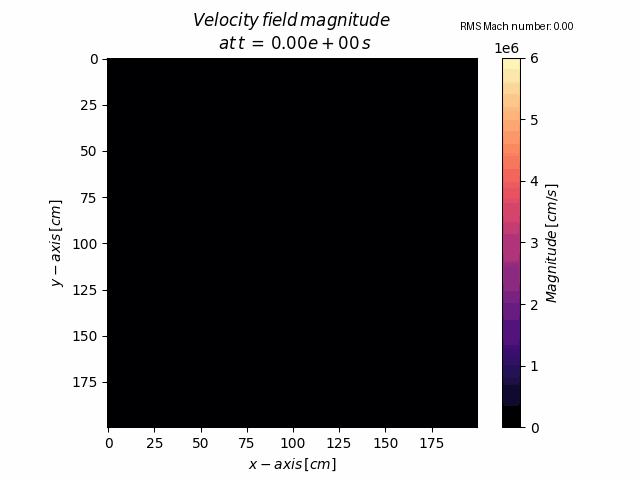

In [30]:
# Let's call it.
# Supersonic data:
images_sup = "./vel_mag_sup/velocity_field_magnitude***.png"
imgif_output_sup = "./vel_mag_sup/velocity_field_magnitude_sup.gif"

movies(images_sup, imgif_output_sup, rms_mach_sup)

# And let's display:
display.Image(open(imgif_output_sup,'rb').read())

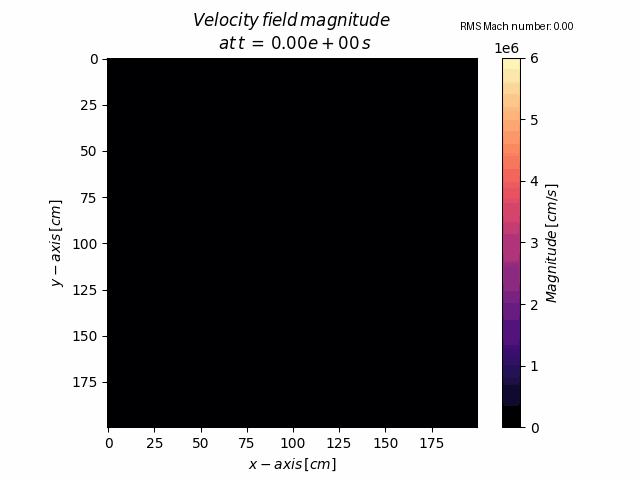

In [31]:
# Subsonic data:
images_sub = "./vel_mag_sub/velocity_field_magnitude***.png"
imgif_output_sub = "./vel_mag_sub/velocity_field_magnitude_sub.gif"

movies(images_sub, imgif_output_sub, rms_mach_sub)

# Display:
display.Image(open(imgif_output_sub,'rb').read())

Results seem pretty good and the RMS Mach number values agrees with what's being shown.